In [2]:
from tensorflow import keras
import pandas as pd
from sklearn.preprocessing import StandardScaler

import plotly.graph_objects as go
import numpy as np
import tensorflow as tf

np.random.seed(1)
tf.random.set_seed(1)

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, RepeatVector, TimeDistributed

print('Tensorflow version: ', tf.__version__)

Tensorflow version:  2.7.0


In [3]:
df = pd.read_csv('turbine6.csv')

In [4]:
df.head()

,Unnamed: 0,Turbine_ID,Timestamp,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg
0,176449,T06,2016-01-01T00:00:00+00:00,1270.0,1232.8,1248.5,6.8,42,51,52,53
1,1957,T06,2016-01-01T00:10:00+00:00,1429.7,203.9,1154.1,271.7,42,51,52,52
2,84192,T06,2016-01-01T00:20:00+00:00,1360.5,250.3,1041.4,382.7,42,50,51,51
3,129954,T06,2016-01-01T00:30:00+00:00,1399.2,1228.8,1252.5,16.5,42,49,50,50
4,23103,T06,2016-01-01T00:40:00+00:00,1302.7,1225.1,1257.6,13.4,41,50,50,51


In [5]:
df = df[['Timestamp','Gen_RPM_Max','Gen_RPM_Min','Gen_RPM_Avg','Gen_RPM_Std','Gen_Bear_Temp_Avg','Gen_Phase1_Temp_Avg','Gen_Phase2_Temp_Avg','Gen_Phase3_Temp_Avg']]

In [6]:
df.dtypes

Timestamp               object
Gen_RPM_Max            float64
Gen_RPM_Min            float64
Gen_RPM_Avg            float64
Gen_RPM_Std            float64
Gen_Bear_Temp_Avg        int64
Gen_Phase1_Temp_Avg      int64
Gen_Phase2_Temp_Avg      int64
Gen_Phase3_Temp_Avg      int64
dtype: object

In [7]:
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

In [8]:
df.dtypes

Timestamp              datetime64[ns, UTC]
Gen_RPM_Max                        float64
Gen_RPM_Min                        float64
Gen_RPM_Avg                        float64
Gen_RPM_Std                        float64
Gen_Bear_Temp_Avg                    int64
Gen_Phase1_Temp_Avg                  int64
Gen_Phase2_Temp_Avg                  int64
Gen_Phase3_Temp_Avg                  int64
dtype: object

In [9]:
df

,Timestamp,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg
0,2016-01-01 00:00:00+00:00,1270.0,1232.8,1248.5,6.8,42,51,52,53
1,2016-01-01 00:10:00+00:00,1429.7,203.9,1154.1,271.7,42,51,52,52
2,2016-01-01 00:20:00+00:00,1360.5,250.3,1041.4,382.7,42,50,51,51
3,2016-01-01 00:30:00+00:00,1399.2,1228.8,1252.5,16.5,42,49,50,50
4,2016-01-01 00:40:00+00:00,1302.7,1225.1,1257.6,13.4,41,50,50,51
...,...,...,...,...,...,...,...,...,...
50570,2016-12-31 23:10:00+00:00,1325.6,1234.7,1265.3,18.4,40,53,55,55
50571,2016-12-31 23:20:00+00:00,1336.2,1234.4,1264.0,19.8,40,53,55,55
50572,2016-12-31 23:30:00+00:00,1310.4,1233.1,1260.9,12.0,39,53,55,55
50573,2016-12-31 23:40:00+00:00,1399.6,1224.1,1268.5,25.7,39,54,55,55


In [12]:
df['Timestamp'].min(), df['Timestamp'].max()

(Timestamp('2016-01-01 00:00:00+0000', tz='UTC'),
 Timestamp('2016-12-31 23:50:00+0000', tz='UTC'))

In [13]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['Timestamp'], y=df['Gen_Bear_Temp_Avg'], name='Gen_Bear_Temp_Avg'))
fig.update_layout(showlegend=True, title='Gen_Bear_Temp_Avg 2016')
fig.show()

In [14]:
train, test = df.loc[df['Timestamp'] <= '2016-09-01 00:00:00+0000'], df.loc[df['Timestamp'] > '2016-09-01 00:00:00+0000']

In [15]:
train.tail()

,Timestamp,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg
33350,2016-08-31 23:20:00+00:00,254.5,39.6,133.4,86.4,34,37,47,37
33351,2016-08-31 23:30:00+00:00,271.4,200.0,241.5,16.9,34,37,47,37
33352,2016-08-31 23:40:00+00:00,278.6,187.9,236.4,21.9,34,37,47,36
33353,2016-08-31 23:50:00+00:00,253.2,216.8,236.6,9.0,34,37,47,36
33354,2016-09-01 00:00:00+00:00,1380.1,242.2,929.8,446.4,34,37,44,37


In [16]:
test.head()

,Timestamp,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg
33355,2016-09-01 00:10:00+00:00,1349.3,1242.1,1269.5,20.0,35,40,45,40
33356,2016-09-01 00:20:00+00:00,1306.4,1239.5,1262.9,11.4,36,43,48,43
33357,2016-09-01 00:30:00+00:00,1517.3,1227.3,1263.6,43.5,38,46,51,45
33358,2016-09-01 00:40:00+00:00,1396.4,1229.8,1266.9,27.3,39,47,52,47
33359,2016-09-01 00:50:00+00:00,1610.3,1242.6,1399.5,105.9,41,49,52,48


In [17]:
train.shape,test.shape

((33355, 9), (17220, 9))

In [18]:
scaler = StandardScaler()
scaler = scaler.fit(train[['Gen_Bear_Temp_Avg']])

train['Gen_Bear_Temp_Avg'] = scaler.transform(train[['Gen_Bear_Temp_Avg']])
test['Gen_Bear_Temp_Avg'] = scaler.transform(test[['Gen_Bear_Temp_Avg']])

train['Gen_RPM_Max'] = scaler.transform(train[['Gen_RPM_Max']])
test['Gen_RPM_Max'] = scaler.transform(test[['Gen_RPM_Max']])

train['Gen_RPM_Min'] = scaler.transform(train[['Gen_RPM_Min']])
test['Gen_RPM_Min'] = scaler.transform(test[['Gen_RPM_Min']])

train['Gen_RPM_Avg'] = scaler.transform(train[['Gen_RPM_Avg']])
test['Gen_RPM_Avg'] = scaler.transform(test[['Gen_RPM_Avg']])

train['Gen_RPM_Std'] = scaler.transform(train[['Gen_RPM_Std']])
test['Gen_RPM_Std'] = scaler.transform(test[['Gen_RPM_Std']])



train['Gen_Phase1_Temp_Avg'] = scaler.transform(train[['Gen_Phase1_Temp_Avg']])
test['Gen_Phase1_Temp_Avg'] = scaler.transform(test[['Gen_Phase1_Temp_Avg']])




train['Gen_Phase2_Temp_Avg'] = scaler.transform(train[['Gen_Phase2_Temp_Avg']])
test['Gen_Phase2_Temp_Avg'] = scaler.transform(test[['Gen_Phase2_Temp_Avg']])


train['Gen_Phase3_Temp_Avg'] = scaler.transform(train[['Gen_Phase3_Temp_Avg']])
test['Gen_Phase3_Temp_Avg'] = scaler.transform(test[['Gen_Phase3_Temp_Avg']])






<ipython-input-18-f64c2b31b8d0>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-18-f64c2b31b8d0>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-18-f64c2b31b8d0>:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-18-f64c2b3

In [20]:
train

,Timestamp,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg
0,2016-01-01 00:00:00+00:00,75.000131,72.722197,73.683583,-2.351624,-0.196161,0.354952,0.416187,0.477422
1,2016-01-01 00:10:00+00:00,84.779322,9.717748,67.903021,13.869465,-0.196161,0.354952,0.416187,0.416187
2,2016-01-01 00:20:00+00:00,80.541877,12.559041,61.001863,20.666524,-0.196161,0.293718,0.354952,0.354952
3,2016-01-01 00:30:00+00:00,82.911662,72.477258,73.928522,-1.757647,-0.196161,0.232483,0.293718,0.293718
4,2016-01-01 00:40:00+00:00,77.002507,72.250690,74.240819,-1.947475,-0.257395,0.293718,0.293718,0.354952
...,...,...,...,...,...,...,...,...,...
33350,2016-08-31 23:20:00+00:00,12.816227,-0.343124,5.400697,2.522663,-0.686039,-0.502334,0.110013,-0.502334
33351,2016-08-31 23:30:00+00:00,13.851094,9.478932,12.020175,-1.733153,-0.686039,-0.502334,0.110013,-0.502334
33352,2016-08-31 23:40:00+00:00,14.291985,8.737992,11.707878,-1.426979,-0.686039,-0.502334,0.110013,-0.563569
33353,2016-08-31 23:50:00+00:00,12.736622,10.507676,11.720125,-2.216908,-0.686039,-0.502334,0.110013,-0.563569


In [22]:
TIME_STEPS=30

def create_sequences(X, y, time_steps=TIME_STEPS):
    Xs, ys = [], []
    for i in range(len(X)-time_steps):
        Xs.append(X.iloc[i:(i+time_steps)].values)
        ys.append(y.iloc[i+time_steps])
    
    return np.array(Xs), np.array(ys)

X_train, y_train = create_sequences(train[['Gen_Bear_Temp_Avg','Gen_RPM_Max']], train['Gen_Bear_Temp_Avg'])
X_test, y_test = create_sequences(test[['Gen_Bear_Temp_Avg','Gen_RPM_Max']], test['Gen_Bear_Temp_Avg'])

In [23]:
print(f'Training shape: {X_train.shape}')

print(f'Testing shape: {X_test.shape}')

Training shape: (33325, 30, 2)
Testing shape: (17190, 30, 2)


In [30]:
model = Sequential()
model.add(LSTM(128, input_shape=(X_train.shape[1], X_train.shape[2])))
model.add(Dropout(rate=0.2))
model.add(RepeatVector(X_train.shape[1]))
model.add(LSTM(128, return_sequences=True))
model.add(Dropout(rate=0.2))
model.add(TimeDistributed(Dense(1)))
model.compile(optimizer='adam', loss='mae')
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 128)               67072     
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 repeat_vector_3 (RepeatVect  (None, 30, 128)          0         
 or)                                                             
                                                                 
 lstm_7 (LSTM)               (None, 30, 128)           131584    
                                                                 
 dropout_7 (Dropout)         (None, 30, 128)           0         
                                                                 
 time_distributed_3 (TimeDis  (None, 30, 1)            129       
 tributed)                                            

In [31]:
history = model.fit(X_train, y_train, epochs=100, batch_size=32, validation_split=0.1,
                    callbacks=[keras.callbacks.EarlyStopping(monitor='val_loss', patience=3, mode='min')], shuffle=False)

Epoch 1/100
938/938 [==============================] - 35s 34ms/step - loss: 0.4366 - val_loss: 0.7366
Epoch 2/100
938/938 [==============================] - 32s 35ms/step - loss: 0.3829 - val_loss: 0.6130
Epoch 3/100
938/938 [==============================] - 32s 34ms/step - loss: 0.3443 - val_loss: 0.3596
Epoch 4/100
938/938 [==============================] - 33s 35ms/step - loss: 0.3159 - val_loss: 0.3608
Epoch 5/100
938/938 [==============================] - 35s 37ms/step - loss: 0.3012 - val_loss: 0.3261
Epoch 6/100
938/938 [==============================] - 33s 35ms/step - loss: 0.2891 - val_loss: 0.3199
Epoch 7/100
938/938 [==============================] - 31s 33ms/step - loss: 0.2824 - val_loss: 0.3452
Epoch 8/100
938/938 [==============================] - 31s 33ms/step - loss: 0.2777 - val_loss: 0.3331
Epoch 9/100
938/938 [==============================] - 33s 35ms/step - loss: 0.2740 - val_loss: 0.3131
Epoch 10/100
938/938 [==============================] - 33s 36ms/step - l

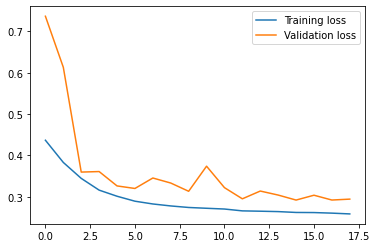

In [32]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training loss')
plt.plot(history.history['val_loss'], label='Validation loss')
plt.legend();

In [33]:
model.evaluate(X_test, y_test)

538/538 [==============================] - 6s 11ms/step - loss: 0.4173


0.4172767698764801

Reconstruction error threshold: 106.36136840157587


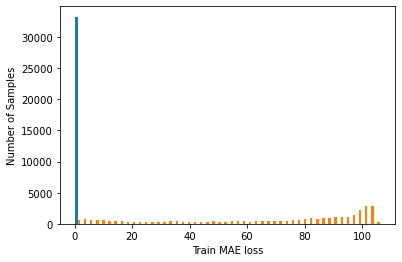

In [34]:
X_train_pred = model.predict(X_train, verbose=0)
train_mae_loss = np.mean(np.abs(X_train_pred - X_train), axis=1)

plt.hist(train_mae_loss, bins=50)
plt.xlabel('Train MAE loss')
plt.ylabel('Number of Samples');

threshold = np.max(train_mae_loss)
print(f'Reconstruction error threshold: {threshold}')

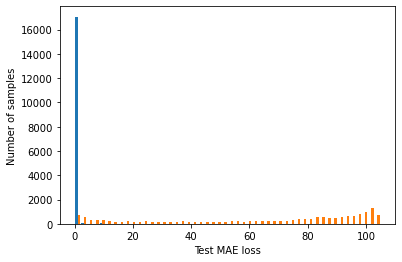

In [35]:
X_test_pred = model.predict(X_test, verbose=0)
test_mae_loss = np.mean(np.abs(X_test_pred-X_test), axis=1)

plt.hist(test_mae_loss, bins=50)
plt.xlabel('Test MAE loss')
plt.ylabel('Number of samples');

In [47]:
test_mae_loss

array([[ 0.48251737, 92.18711383],
       [ 0.474482  , 92.83750189],
       [ 0.48283081, 93.5711143 ],
       ...,
       [ 0.36307099, 87.42299336],
       [ 0.30710293, 86.72433861],
       [ 0.28600731, 86.18941663]])

In [39]:
test_score_df = pd.DataFrame(test[TIME_STEPS:])
test_score_df['loss'] = test_mae_loss[0]
test_score_df['threshold'] = threshold
test_score_df['anomaly'] = test_score_df['loss'] > test_score_df['threshold']
test_score_df['Gen_Bear_Temp_Avg'] = test[TIME_STEPS:]['Gen_Bear_Temp_Avg']

ValueError: Length of values (2) does not match length of index (17190)

In [37]:
test_score_df.tail()

,Timestamp,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg
50570,2016-12-31 23:10:00+00:00,78.404783,72.838543,74.712327,-1.641301,-0.318630,0.477422,0.599891,0.599891
50571,2016-12-31 23:20:00+00:00,79.053872,72.820173,74.632722,-1.555572,-0.318630,0.477422,0.599891,0.599891
50572,2016-12-31 23:30:00+00:00,77.474015,72.740568,74.442894,-2.033203,-0.379865,0.477422,0.599891,0.599891
50573,2016-12-31 23:40:00+00:00,82.936156,72.189455,74.908278,-1.194287,-0.379865,0.538657,0.599891,0.599891
50574,2016-12-31 23:50:00+00:00,78.404783,72.826296,74.896031,-1.524955,-0.379865,0.538657,0.599891,0.599891


In [26]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Timestamp'], y=test_score_df['loss'], name='Test loss'))
fig.add_trace(go.Scatter(x=test_score_df['Timestamp'], y=test_score_df['threshold'], name='Threshold'))
fig.update_layout(showlegend=True, title='Test loss vs. Threshold')
fig.show()

In [27]:
anomalies = test_score_df.loc[test_score_df['anomaly'] == True]
anomalies.head()

,Timestamp,Gen_Bear_Temp_Avg,loss,threshold,anomaly
42217,2016-11-02 14:00:00+00:00,9.785106,5.276073,5.180139,True
42218,2016-11-02 14:10:00+00:00,9.785106,5.372250,5.180139,True
42219,2016-11-02 14:30:00+00:00,9.785106,5.468507,5.180139,True
42220,2016-11-03 20:20:00+00:00,9.785106,5.564823,5.180139,True
42221,2016-11-03 20:30:00+00:00,9.785106,5.661182,5.180139,True


In [28]:
anomalies.shape

(94, 5)

In [29]:
test_score_df

,Timestamp,Gen_Bear_Temp_Avg,loss,threshold,anomaly
33385,2016-09-01 05:10:00+00:00,0.293718,0.274887,5.180139,False
33386,2016-09-01 05:20:00+00:00,0.354952,0.254319,5.180139,False
33387,2016-09-01 05:30:00+00:00,0.416187,0.289119,5.180139,False
33388,2016-09-01 05:40:00+00:00,0.477422,0.334345,5.180139,False
33389,2016-09-01 05:50:00+00:00,0.477422,0.379559,5.180139,False
...,...,...,...,...,...
50570,2016-12-31 23:10:00+00:00,-0.318630,0.430070,5.180139,False
50571,2016-12-31 23:20:00+00:00,-0.318630,0.366795,5.180139,False
50572,2016-12-31 23:30:00+00:00,-0.379865,0.303496,5.180139,False
50573,2016-12-31 23:40:00+00:00,-0.379865,0.303420,5.180139,False


In [32]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=test_score_df['Timestamp'], y=scaler.inverse_transform(test_score_df['Gen_Bear_Temp_Avg']), name='Gen_Bear_Temp_Avg'))
fig.add_trace(go.Scatter(x=anomalies['Timestamp'], y=scaler.inverse_transform(anomalies['Gen_Bear_Temp_Avg']), mode='markers', name='Anomaly'))
fig.update_layout(showlegend=True, title='Detected anomalies')
fig.show()